C:\Users\Jackson\AppData\Local\Temp/ipykernel_19496/2853789424.py:16: UserWarning: The following kwargs were not used by contour: 'linewidth'
  plt.contour(LSF, [0], colors='b', linewidth=2)


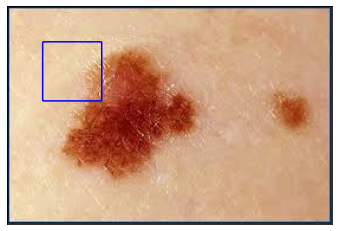

C:\Users\Jackson\AppData\Local\Temp/ipykernel_19496/2853789424.py:71: UserWarning: The following kwargs were not used by contour: 'linewidth'
  plt.contour(evolved_LSF, [0], colors='r', linewidth=2)


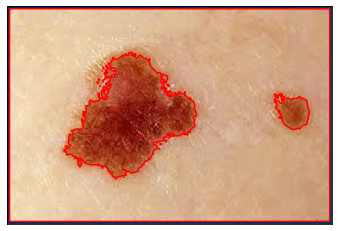

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

# Load and preprocess the image
image = cv2.imread(r"C:\Users\Jackson\Desktop\cccc.jpg")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
LSF = np.ones_like(gray_image, dtype=np.float64)
LSF[30:80, 30:80] = -1
LSF = -LSF

# Display the original image with initial contour
plt.figure()
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.contour(LSF, [0], colors='b', linewidth=2)
plt.xticks([]), plt.yticks([])
plt.show()

# Function to perform mathematical operations on matrices
def apply_math(input_matrix, operation):
    output = np.copy(input_matrix)
    for i in range(input_matrix.shape[0]):
        for j in range(input_matrix.shape[1]):
            if operation == "atan":
                output[i, j] = math.atan(input_matrix[i, j])
            elif operation == "sqrt":
                output[i, j] = math.sqrt(input_matrix[i, j])
    return output

# Function to perform the CV evolution
def evolve_cv(LSF, img, mu, nu, epsilon, step, num_iterations):
    for _ in range(num_iterations):
        Drc = (epsilon / math.pi) / (epsilon * epsilon + LSF * LSF)
        Heaviside = 0.5 * (1 + (2 / math.pi) * apply_math(LSF / epsilon, "atan"))

        Iy, Ix = np.gradient(LSF)
        s = apply_math(Ix * Ix + Iy * Iy, "sqrt")
        Nx = Ix / (s + 0.000001)
        Ny = Iy / (s + 0.000001)
        Mxx, _ = np.gradient(Nx)
        Nyy, _ = np.gradient(Ny)
        curvature = Mxx + Nyy
        length_term = nu * Drc * curvature

        laplacian = cv2.Laplacian(LSF, -1)
        penalty_term = mu * (laplacian - curvature)

        s1 = Heaviside * img
        s2 = (1 - Heaviside) * img
        s3 = 1 - Heaviside
        C1 = np.sum(s1) / np.sum(Heaviside)
        C2 = np.sum(s2) / np.sum(s3)
        CV_term = Drc * (-1 * (img - C1) * (img - C1) + 1 * (img - C2) * (img - C2))

        LSF = LSF + step * (length_term + penalty_term + CV_term)

    return LSF

# Parameters for CV evolution
mu = 1
nu = 0.003 * 255 * 255
epsilon = 1
step_size = 0.1
num_iterations = 50

# Perform CV evolution and display the results
evolved_LSF = evolve_cv(LSF, gray_image, mu, nu, epsilon, step_size, num_iterations)
plt.figure()
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.contour(evolved_LSF, [0], colors='r', linewidth=2)
plt.xticks([]), plt.yticks([])
plt.show()

C:\Users\Jackson\AppData\Local\Temp/ipykernel_19496/256596597.py:16: UserWarning: The following kwargs were not used by contour: 'linewidth'
  plt.contour(LSF, [0], colors='b', linewidth=2)


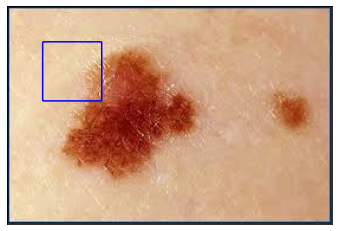

C:\Users\Jackson\AppData\Local\Temp/ipykernel_19496/256596597.py:61: UserWarning: The following kwargs were not used by contour: 'linewidth'
  plt.contour(LSF, [0], colors='r', linewidth=2)


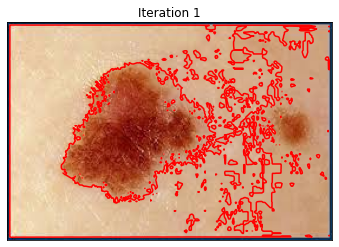

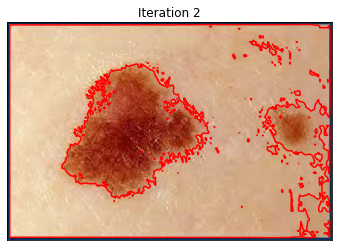

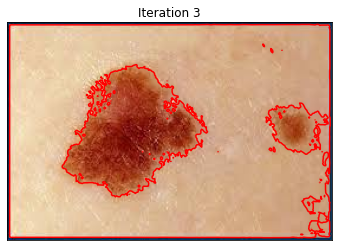

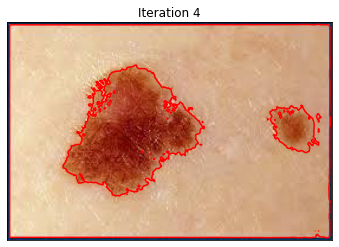

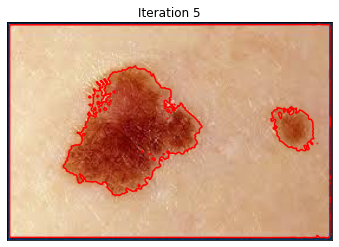

...

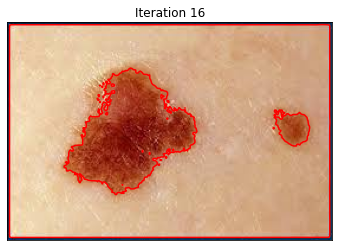

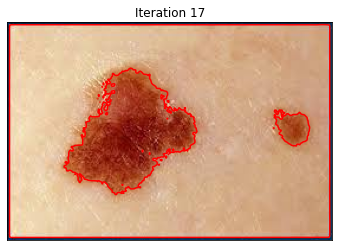

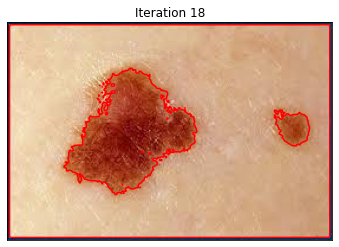

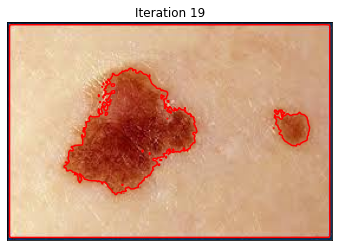

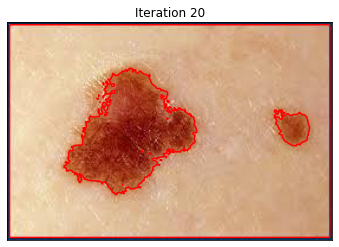

C:\Users\Jackson\AppData\Local\Temp/ipykernel_19496/256596597.py:79: UserWarning: The following kwargs were not used by contour: 'linewidth'
  plt.contour(evolved_LSF, [0], colors='r', linewidth=2)


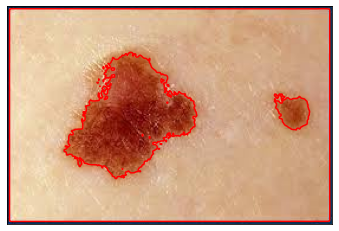

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

# Load and preprocess the image
image = cv2.imread(r"C:\Users\Jackson\Desktop\cccc.jpg")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
LSF = np.ones_like(gray_image, dtype=np.float64)
LSF[30:80, 30:80] = -1
LSF = -LSF

# Display the original image with initial contour
plt.figure()
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.contour(LSF, [0], colors='b', linewidth=2)
plt.xticks([]), plt.yticks([])
plt.show()

# Function to perform mathematical operations on matrices
def apply_math(input_matrix, operation):
    output = np.copy(input_matrix)
    for i in range(input_matrix.shape[0]):
        for j in range(input_matrix.shape[1]):
            if operation == "atan":
                output[i, j] = math.atan(input_matrix[i, j])
            elif operation == "sqrt":
                output[i, j] = math.sqrt(input_matrix[i, j])
    return output

# Function to perform the CV evolution
def evolve_cv(LSF, img, mu, nu, epsilon, step, num_iterations):
    for i in range(num_iterations):
        Drc = (epsilon / math.pi) / (epsilon * epsilon + LSF * LSF)
        Heaviside = 0.5 * (1 + (2 / math.pi) * apply_math(LSF / epsilon, "atan"))

        Iy, Ix = np.gradient(LSF)
        s = apply_math(Ix * Ix + Iy * Iy, "sqrt")
        Nx = Ix / (s + 0.000001)
        Ny = Iy / (s + 0.000001)
        Mxx, _ = np.gradient(Nx)
        Nyy, _ = np.gradient(Ny)
        curvature = Mxx + Nyy
        length_term = nu * Drc * curvature

        laplacian = cv2.Laplacian(LSF, -1)
        penalty_term = mu * (laplacian - curvature)

        s1 = Heaviside * img
        s2 = (1 - Heaviside) * img
        s3 = 1 - Heaviside
        C1 = np.sum(s1) / np.sum(Heaviside)
        C2 = np.sum(s2) / np.sum(s3)
        CV_term = Drc * (-1 * (img - C1) * (img - C1) + 1 * (img - C2) * (img - C2))

        LSF = LSF + step * (length_term + penalty_term + CV_term)

        # Display the current iteration
        plt.figure()
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.contour(LSF, [0], colors='r', linewidth=2)
        plt.xticks([]), plt.yticks([])
        plt.title(f"Iteration {i+1}")
        plt.show()

    return LSF

# Parameters for CV evolution
mu = 1
nu = 0.003 * 255 * 255
epsilon = 1
step_size = 0.1
num_iterations = 20

# Perform CV evolution and display the results
evolved_LSF = evolve_cv(LSF, gray_image, mu, nu, epsilon, step_size, num_iterations)
plt.figure()
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.contour(evolved_LSF, [0], colors='r', linewidth=2)
plt.xticks([]), plt.yticks([])
plt.show()

C:\Users\Jackson\AppData\Local\Temp/ipykernel_19496/1757522051.py:16: UserWarning: The following kwargs were not used by contour: 'linewidth'
  plt.contour(LSF, [0], colors='b', linewidth=2)


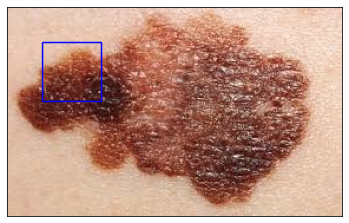

C:\Users\Jackson\AppData\Local\Temp/ipykernel_19496/1757522051.py:61: UserWarning: The following kwargs were not used by contour: 'linewidth'
  plt.contour(LSF, [0], colors='r', linewidth=2)


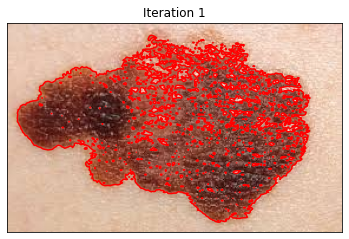

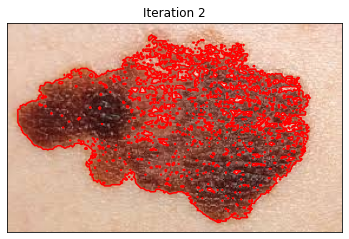

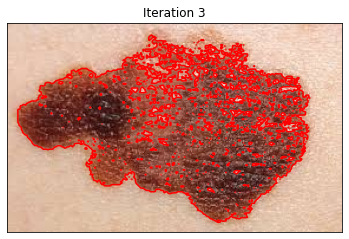

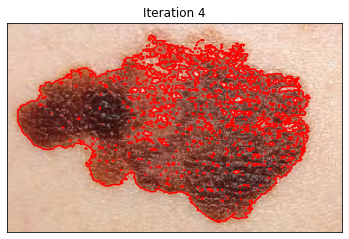

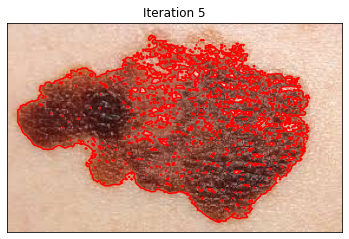

...

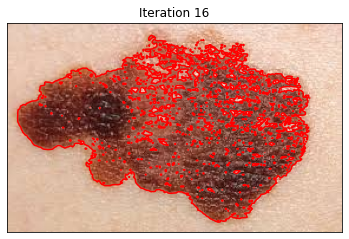

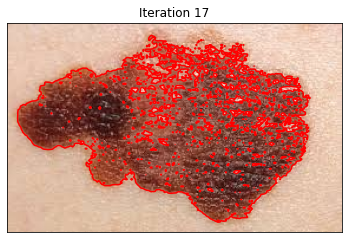

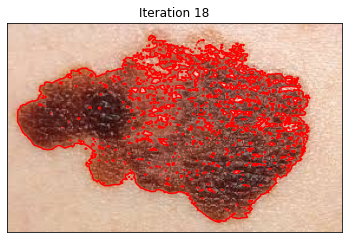

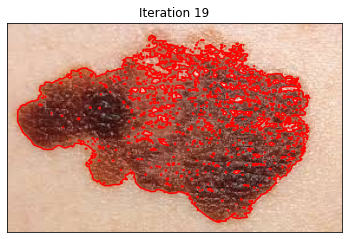

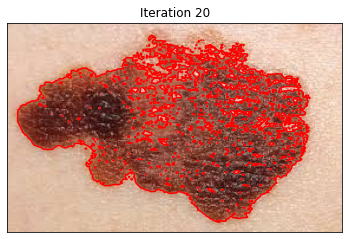

C:\Users\Jackson\AppData\Local\Temp/ipykernel_19496/1757522051.py:79: UserWarning: The following kwargs were not used by contour: 'linewidth'
  plt.contour(evolved_LSF, [0], colors='r', linewidth=2)


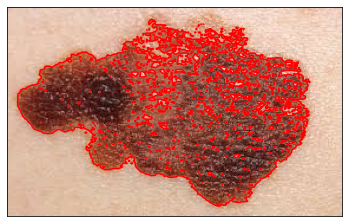

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

# Load and preprocess the image
image = cv2.imread(r"C:\Users\Jackson\Desktop\cc1.jpeg")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
LSF = np.ones_like(gray_image, dtype=np.float64)
LSF[30:80, 30:80] = -1
LSF = -LSF

# Display the original image with initial contour
plt.figure()
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.contour(LSF, [0], colors='b', linewidth=2)
plt.xticks([]), plt.yticks([])
plt.show()

# Function to perform mathematical operations on matrices
def apply_math(input_matrix, operation):
    output = np.copy(input_matrix)
    for i in range(input_matrix.shape[0]):
        for j in range(input_matrix.shape[1]):
            if operation == "atan":
                output[i, j] = math.atan(input_matrix[i, j])
            elif operation == "sqrt":
                output[i, j] = math.sqrt(input_matrix[i, j])
    return output

# Function to perform the CV evolution
def evolve_cv(LSF, img, mu, nu, epsilon, step, num_iterations):
    for i in range(num_iterations):
        Drc = (epsilon / math.pi) / (epsilon * epsilon + LSF * LSF)
        Heaviside = 0.5 * (1 + (2 / math.pi) * apply_math(LSF / epsilon, "atan"))

        Iy, Ix = np.gradient(LSF)
        s = apply_math(Ix * Ix + Iy * Iy, "sqrt")
        Nx = Ix / (s + 0.000001)
        Ny = Iy / (s + 0.000001)
        Mxx, _ = np.gradient(Nx)
        Nyy, _ = np.gradient(Ny)
        curvature = Mxx + Nyy
        length_term = nu * Drc * curvature

        laplacian = cv2.Laplacian(LSF, -1)
        penalty_term = mu * (laplacian - curvature)

        s1 = Heaviside * img
        s2 = (1 - Heaviside) * img
        s3 = 1 - Heaviside
        C1 = np.sum(s1) / np.sum(Heaviside)
        C2 = np.sum(s2) / np.sum(s3)
        CV_term = Drc * (-1 * (img - C1) * (img - C1) + 1 * (img - C2) * (img - C2))

        LSF = LSF + step * (length_term + penalty_term + CV_term)

        # Display the current iteration
        plt.figure()
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.contour(LSF, [0], colors='r', linewidth=2)
        plt.xticks([]), plt.yticks([])
        plt.title(f"Iteration {i+1}")
        plt.show()

    return LSF

# Parameters for CV evolution
mu = 1
nu = 0.003 * 255 * 255
epsilon = 1
step_size = 0.1
num_iterations = 20

# Perform CV evolution and display the results
evolved_LSF = evolve_cv(LSF, gray_image, mu, nu, epsilon, step_size, num_iterations)
plt.figure()
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.contour(evolved_LSF, [0], colors='r', linewidth=2)
plt.xticks([]), plt.yticks([])
plt.show()

SyntaxError: invalid syntax (Temp/ipykernel_19496/3339695620.py, line 7)

C:\Users\Jackson\AppData\Local\Temp/ipykernel_19496/1880134216.py:16: UserWarning: The following kwargs were not used by contour: 'linewidth'
  plt.contour(LSF, [0], colors='b', linewidth=2)


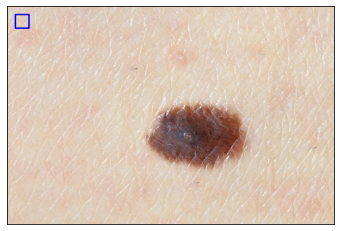

C:\Users\Jackson\AppData\Local\Temp/ipykernel_19496/1880134216.py:61: UserWarning: The following kwargs were not used by contour: 'linewidth'
  plt.contour(LSF, [0], colors='r', linewidth=2)


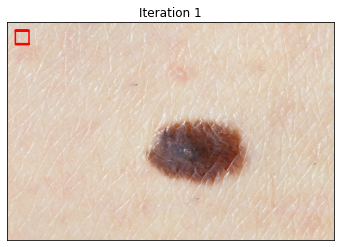

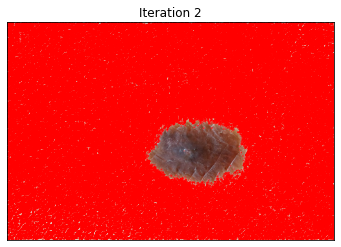

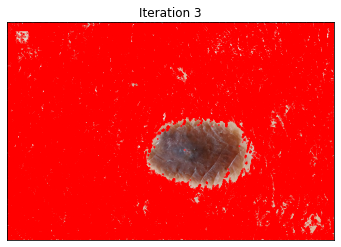

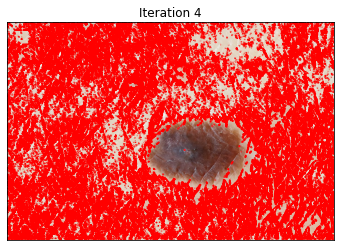

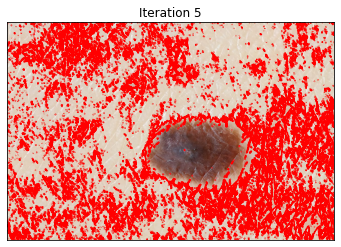

...

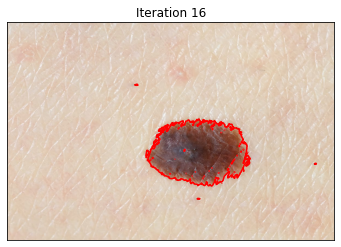

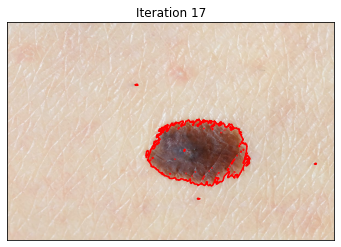

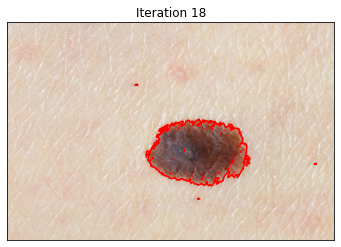

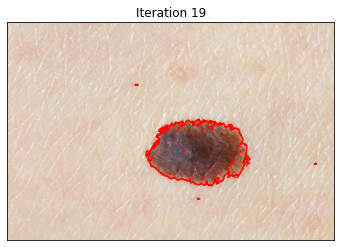

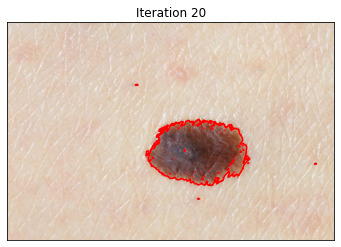

C:\Users\Jackson\AppData\Local\Temp/ipykernel_19496/1880134216.py:79: UserWarning: The following kwargs were not used by contour: 'linewidth'
  plt.contour(evolved_LSF, [0], colors='r', linewidth=2)


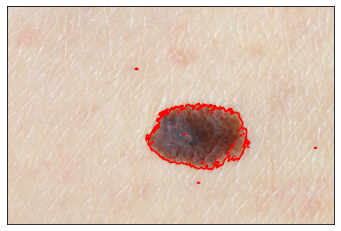

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

# Load and preprocess the image
image = cv2.imread(r"C:\Users\Jackson\Desktop\cc2.jpg")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
LSF = np.ones_like(gray_image, dtype=np.float64)
LSF[30:80, 30:80] = -1
LSF = -LSF

# Display the original image with initial contour
plt.figure()
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.contour(LSF, [0], colors='b', linewidth=2)
plt.xticks([]), plt.yticks([])
plt.show()

# Function to perform mathematical operations on matrices
def apply_math(input_matrix, operation):
    output = np.copy(input_matrix)
    for i in range(input_matrix.shape[0]):
        for j in range(input_matrix.shape[1]):
            if operation == "atan":
                output[i, j] = math.atan(input_matrix[i, j])
            elif operation == "sqrt":
                output[i, j] = math.sqrt(input_matrix[i, j])
    return output

# Function to perform the CV evolution
def evolve_cv(LSF, img, mu, nu, epsilon, step, num_iterations):
    for i in range(num_iterations):
        Drc = (epsilon / math.pi) / (epsilon * epsilon + LSF * LSF)
        Heaviside = 0.5 * (1 + (2 / math.pi) * apply_math(LSF / epsilon, "atan"))

        Iy, Ix = np.gradient(LSF)
        s = apply_math(Ix * Ix + Iy * Iy, "sqrt")
        Nx = Ix / (s + 0.000001)
        Ny = Iy / (s + 0.000001)
        Mxx, _ = np.gradient(Nx)
        Nyy, _ = np.gradient(Ny)
        curvature = Mxx + Nyy
        length_term = nu * Drc * curvature

        laplacian = cv2.Laplacian(LSF, -1)
        penalty_term = mu * (laplacian - curvature)

        s1 = Heaviside * img
        s2 = (1 - Heaviside) * img
        s3 = 1 - Heaviside
        C1 = np.sum(s1) / np.sum(Heaviside)
        C2 = np.sum(s2) / np.sum(s3)
        CV_term = Drc * (-1 * (img - C1) * (img - C1) + 1 * (img - C2) * (img - C2))

        LSF = LSF + step * (length_term + penalty_term + CV_term)

        # Display the current iteration
        plt.figure()
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.contour(LSF, [0], colors='r', linewidth=2)
        plt.xticks([]), plt.yticks([])
        plt.title(f"Iteration {i+1}")
        plt.show()

    return LSF

# Parameters for CV evolution
mu = 1
nu = 0.003 * 255 * 255
epsilon = 1
step_size = 0.1
num_iterations = 20

# Perform CV evolution and display the results
evolved_LSF = evolve_cv(LSF, gray_image, mu, nu, epsilon, step_size, num_iterations)
plt.figure()
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.contour(evolved_LSF, [0], colors='r', linewidth=2)
plt.xticks([]), plt.yticks([])
plt.show()